l1*(g*m1*sin(theta1(t)) + g*m2*sin(theta1(t)) + l1*m1*Derivative(theta1(t), (t, 2)) + l1*m2*Derivative(theta1(t), (t, 2)) + l2*m2*sin(theta1(t) - theta2(t))*Derivative(theta2(t), t)**2 + l2*m2*cos(theta1(t) - theta2(t))*Derivative(theta2(t), (t, 2)))

l2*m2*(g*sin(theta2(t)) - l1*sin(theta1(t) - theta2(t))*Derivative(theta1(t), t)**2 + l1*cos(theta1(t) - theta2(t))*Derivative(theta1(t), (t, 2)) + l2*Derivative(theta2(t), (t, 2)))

(-0.5*g*m1*sin(theta1(t)) - 0.25*g*m2*sin(theta1(t) - 2*theta2(t)) - 0.25*g*m2*sin(theta1(t)) - 0.25*l1*m2*sin(2*theta1(t) - 2*theta2(t))*Derivative(theta1(t), t)**2 - 0.5*l2*m2*sin(theta1(t) - theta2(t))*Derivative(theta2(t), t)**2)/(l1*(0.5*m1 - 0.25*m2*cos(2*theta1(t) - 2*theta2(t)) + 0.25*m2))

(0.25*g*m1*sin(2*theta1(t) - theta2(t)) - 0.25*g*m1*sin(theta2(t)) + 0.25*g*m2*sin(2*theta1(t) - theta2(t)) - 0.25*g*m2*sin(theta2(t)) + 0.5*l1*m1*sin(theta1(t) - theta2(t))*Derivative(theta1(t), t)**2 + 0.5*l1*m2*sin(theta1(t) - theta2(t))*Derivative(theta1(t), t)**2 + 0.25*l2*m2*sin(2*theta1(t) - 2*theta2(t))*Derivative(theta2(t), t)**2)/(l2*(0.5*m1 - 0.25*m2*cos(2*theta1(t) - 2*theta2(t)) + 0.25*m2))

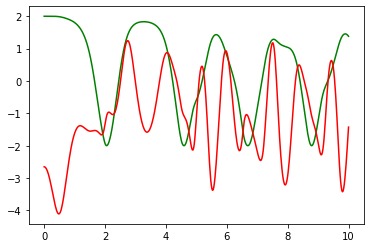

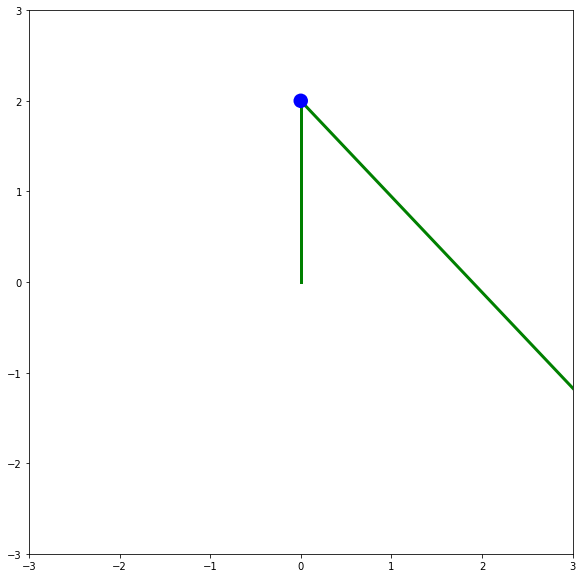

In [1]:
import numpy as np
import sympy as sp
from sympy.utilities import lambdify
from sympy.solvers import solve
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from matplotlib import animation
from matplotlib.animation import PillowWriter
from IPython.display import HTML
class Double_Pendulum : 
    def __init__(self, t, g, l1, l2, m1, m2, theta10, theta20, v10, v20) : 
        self.t = t
        self.g = g
        self.l1 = l1
        self.l2 = l2
        self.m1 = m1
        self.m2 = m2
        self.conditions = [theta10, v10, theta20, v20]
        
    def solve(self):
        
        t, g, l1, l2, m1, m2 = sp.symbols(('t', 'g', 'l1', 'l2', 'm1', 'm2'))
        
        theta1, theta2 = sp.Function('theta1')(t), sp.Function('theta2')(t)
        
        theta1_d, theta2_d = theta1.diff(t), theta2.diff(t)
        
        theta1_dd, theta2_dd = theta1_d.diff(t), theta2_d.diff(t)


        x1, y1 = l1*sp.sin(theta1), -l1*sp.cos(theta1)
        x1_d, y1_d = x1.diff(t), y1.diff(t)
        
        x2, y2 = l2*sp.sin(theta2) + x1, -l2*sp.cos(theta2) + y1
        x2_d, y2_d = x2.diff(t), y2.diff(t)
        
        T1 = 0.5*m1*(x1_d**2 + y1_d**2)
        T2 = 0.5*m2*(x2_d**2 + y2_d**2)
        
        T = T1 + T2
        
        V1 = m1*g*y1
        V2 = m2*g*y2
        V = V1 + V2
        
        L = T - V
        
        # ELs equations
        def get_eqs(L, theta, theta_d) :
            LHS = sp.diff(L.diff(theta_d),t)
            RHS = L.diff(theta)
            return LHS - RHS
        
        EL1 = get_eqs(L, theta1, theta1_d)
        EL2 = get_eqs(L, theta2, theta2_d)
        
        display(EL1.simplify())
        display(EL2.simplify())
        
        # rewrite ELs to isolate thetai_dd in each equation
        acceleration = sp.solve([EL1, EL2], (theta1_dd, theta2_dd))
        
        EL1 = acceleration[theta1_dd]
        EL2 = acceleration[theta2_dd]
                
        display(EL1.simplify())
        
        display(EL2.simplify())
        
        #lambdify
        dtheta1dt_f = sp.lambdify(theta1_d, theta1_d)
        
        dU1dt_f = sp.lambdify((g, l1, l2, m1, m2, theta1, theta2, theta1_d, theta2_d), EL1)
        
        dtheta2dt_f = sp.lambdify(theta2_d, theta2_d)
        
        dU2dt_f = sp.lambdify((g, l1, l2, m1, m2, theta1, theta2, theta1_d, theta2_d), EL2)
        
        x1_f, y1_f = sp.lambdify((l1, theta1), x1), sp.lambdify((l1, theta1), y1)
        
        x2_f, y2_f = sp.lambdify((l1, theta1, l2, theta2), x2), sp.lambdify((l1, theta1, l2, theta2), y2)
         
        # solve numerically
        t, g = self.t, self.g
        m1, m2 = self.m1, self.m2
        l1, l2 = self.l1, self. l2
        
        def dXdt(X,t):
            
            theta1_f, u1_f, theta2_f, u2_f = X
            
            # here the function return the vector state X whose components have 
            # the new numerical fonction defined above instead of the old args
            # and we replace theta_d by u
            return [dtheta1dt_f(u1_f),
                   dU1dt_f(g, l1, l2, m1, m2, theta1_f, theta2_f, u1_f, u2_f),
                   dtheta2dt_f(u2_f),
                   dU2dt_f(g, l1, l2, m1, m2, theta1_f, theta2_f, u1_f, u2_f),
                   ] 
        
        solution = odeint(dXdt, y0 = self.conditions, t=t)
        # solution above is the vector state X solution in array form, use .T to change in matrix
        sol = solution.T
        the1 = sol[0]
        the2 = sol[2]
        
        return x1_f(l1, the1), y1_f(l1, the1), x2_f(l1, l2, the1, the2), y2_f(l1, l2, the1, the2)
    
t = np.linspace(0, 10, 500)
g = 9.81
double_p = Double_Pendulum(t,g, 2, 1, 3, 1, np.pi, np.pi/3, 0, 0)
x1, y1, x2, y2 = double_p.solve()

plt.plot(t,y1, 'g', label = 'y1(t)')
plt.plot(t, y2, 'r', label = 'y2(t)')
plt.show()

# Animation part, totally plagiarized 

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(aspect='equal')

line1, = ax.plot([0, x1[0]], [0, y1[0]], lw=3, c='green')
line2, = ax.plot([x1[0], x2[0]], [y1[0], y2[0]], lw=3, c='green')

bob_radius = 0.08
circle1 = ax.add_patch(plt.Circle((x1[0], y1[0]), bob_radius, fc='b', zorder=3))
circle2 = ax.add_patch(plt.Circle((x2[0], y2[0]), bob_radius, fc='b', zorder=3))

ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])


def animate(i):
    line1.set_data([0, x1[i]], [0, y1[i]])
    line2.set_data([x1[i], x2[i]], [y1[i], y2[i]])

    circle1.set_center((x1[i], y1[i]))
    circle2.set_center((x2[i], y2[i]))


nframes = len(x1)
dt = t[1] - t[0]
interval = dt * 1000
ani = animation.FuncAnimation(fig, animate, frames=nframes, repeat=True, interval=interval)

Writer = animation.writers['pillow']
writer = Writer(fps=1 / dt, metadata=dict(artist='Moi'), bitrate=1800)
ani.save('animation.gif', writer=writer)

HTML(ani.to_jshtml())